# Introduction

In this notebook, we present more experiments and results of our proposed method to identify leaves from a tree point cloud obtained by a terrestrial LiDAR scanner. We also summarize our method and discuss some drawbacks.

## Approach Summary
Our method goes through several steps:
1. Keep only the tree half which faces the LiDAR scanner.

2. Cluster the tree into smaller clusters.

3. Use diffrent clustering proposing methods (DBSCAN with different scaling of y-axis and z-axis; RANSAC plane fitting) to find the best clustering which gives the most leaf-like clusters for each smaller cluster. The leaf-like clusters are identified by shape analysis.

4. Compute leaf area for each identified leaf cluster and sum them up to get the total leaf area. The leaves areas are aproximated by half the area of the convex hull of the leaf clusters, because we assume the leaves are flat surfaces.

5. Only keep the leaves which have area below 0.15 m^2 to avoid suspiciously large leaves.

6. Visualize the final result and show CT scans along different axes, for qualitative evaluation.

7. Report the total leaf area as our estimation of leaf area of the tree.

In [1]:
%matplotlib ipympl

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

import laspy
import lazrs

In [2]:
def read_pc(path, pt_src_id):
    las = laspy.read(path)
    pc = np.array([las.x, las.y, las.z]).T
    object_id = las["hitObjectId"]
    classification = las["classification"]
    #pt_src_id = np.repeat(pt_src_id, pc.shape[0])

    # Filtering
    z_threshold = 0.05
    mask = pc[:, 2] > z_threshold 
    pc_filtered = pc[mask]
    object_id_filtered = object_id[mask]
    classification_filtered = classification[mask]
    pt_src_id_filtered = np.full(pc_filtered.shape[0], pt_src_id)
    

    return pc_filtered, object_id_filtered, classification_filtered, pt_src_id_filtered

In [3]:
# loading the simulated data from helio++
output_path = r"./2025-12-06_12-55-42"
# Static point cloud

print("Loading points from", Path(output_path))

pc_s_1, object_id_s_1, classification_s_1, pt_src_id_s_1 = read_pc(
    Path(output_path) / "leg000_points.laz", 1
)
pc_s_2, object_id_s_2, classification_s_2, pt_src_id_s_2 = read_pc(
    Path(output_path) / "leg001_points.laz", 2
)
pc_s_3, object_id_s_3, classification_s_3, pt_src_id_s_3 = read_pc(
    Path(output_path) / "leg002_points.laz", 3
)
pc_s_4, object_id_s_4, classification_s_4, pt_src_id_s_4 = read_pc(
    Path(output_path) / "leg003_points.laz", 4
)

print("Merging files")

pc = np.vstack((pc_s_1, pc_s_2, pc_s_3, pc_s_4))
object_id = np.hstack(
    (
        object_id_s_1,
        object_id_s_2,
        object_id_s_3,
        object_id_s_4
    )
)
classification = np.hstack(
    (
        classification_s_1,
        classification_s_2,
        classification_s_3,
        classification_s_4
    )
)
pt_src_id = np.hstack(
    (
        pt_src_id_s_1,
        pt_src_id_s_2,
        pt_src_id_s_3,
        pt_src_id_s_4
    )
)

point_cloud_sim = pc
print(f"Total number of points in the simulated tree: {point_cloud_sim.shape[0]}")

Loading points from 2025-12-06_12-55-42
Merging files
Total number of points in the simulated tree: 87453


In [4]:
# read point clouds data from txt file, each row is a point (x,y,z)
point_clouds = np.loadtxt('tls_points.txt')
print(f"Total points in point cloud: {point_clouds.shape[0]}")

point_clouds = point_cloud_sim
print(f"Total points in point cloud: {point_clouds.shape[0]}")

Total points in point cloud: 177748
Total points in point cloud: 87453


# Keep only the tree

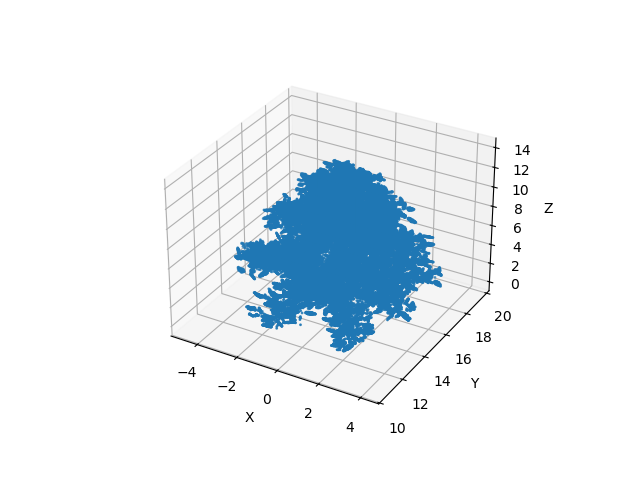

In [5]:
# plot the point clouds interactively
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(point_clouds[:,0], point_clouds[:,1], point_clouds[:,2], s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

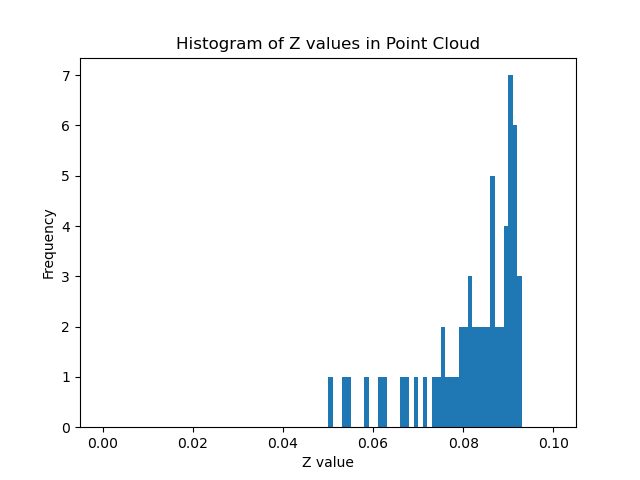

In [6]:
# remove all z points below a certain threshold (e.g., ground level)
# plot histogram of z values to determine threshold
# new plot
fig = plt.figure()
plt.hist(point_clouds[:,2], bins=100, range=(0, 0.1))
plt.xlabel('Z value')
plt.ylabel('Frequency')
plt.title('Histogram of Z values in Point Cloud')
plt.show()

Points after removing ground level: 87453


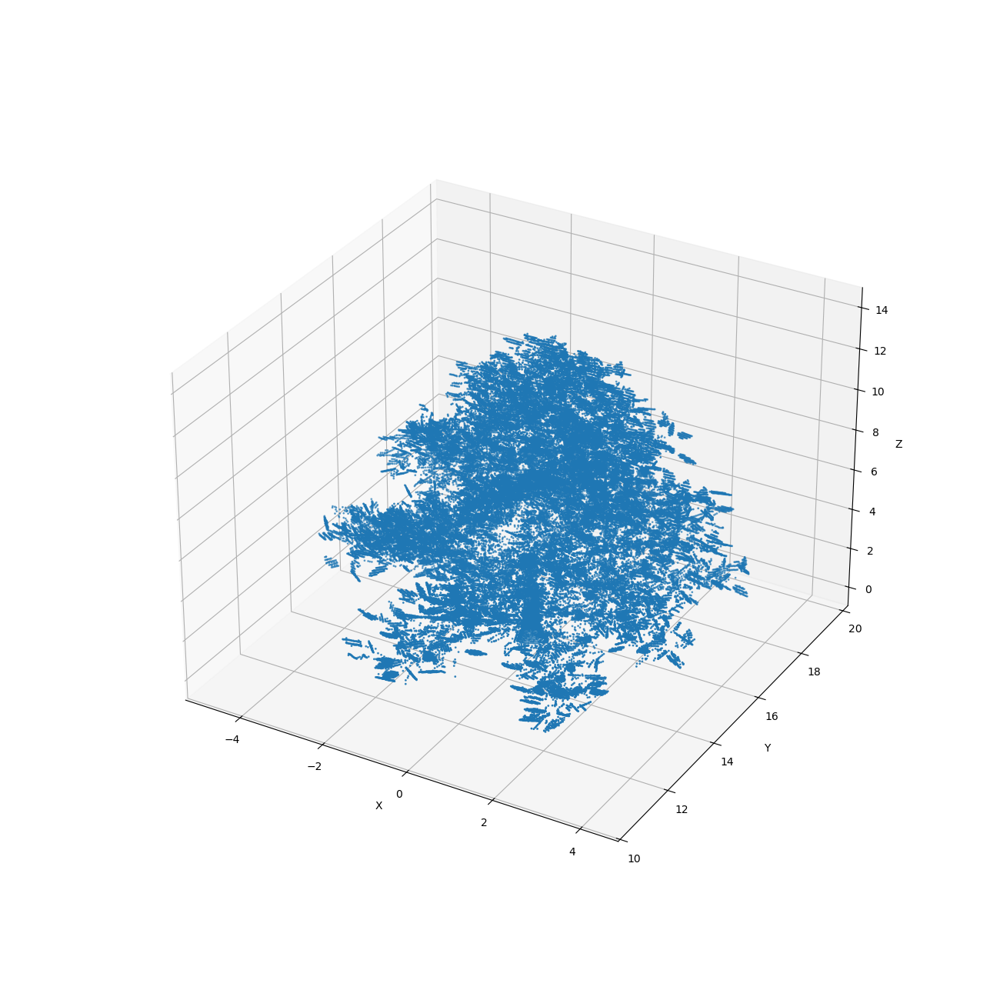

In [7]:
# remove all z_points below 0.02
z_threshold = 0.05
filtered_points = point_clouds[point_clouds[:,2] > z_threshold]
print(f"Points after removing ground level: {filtered_points.shape[0]}")    
# plot filtered point clouds
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(filtered_points[:,0], filtered_points[:,1], filtered_points[:,2], s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

# Keep only the tree half which faces the LiDAR scanner

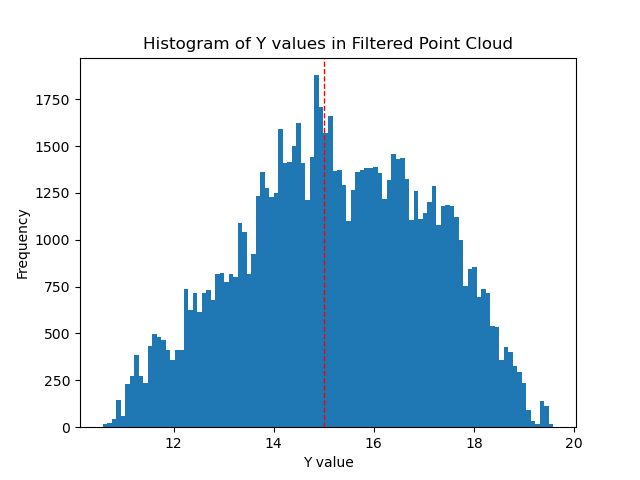

In [8]:
# plot histogram on Y values 
fig = plt.figure()
plt.hist(filtered_points[:,1], bins=100)
# plot mode
mode_y = 15
plt.axvline(mode_y, color='r', linestyle='dashed', linewidth=1)
plt.xlabel('Y value')
plt.ylabel('Frequency')
plt.title('Histogram of Y values in Filtered Point Cloud')
plt.show()

In [9]:
# # filter out all points with y > mode_y
y_threshold = np.max(point_cloud_sim[:,1])  # keep all points
# y_threshold = mode_y + 0.1 # add some margin in case some leaves get cut off


filtered_points = filtered_points[filtered_points[:,1] < y_threshold]
# print(f"Points after removing high Y values: {filtered_points.shape[0]}")    
# # plot final point clouds
# fig = plt.figure(figsize=(10, 8))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(filtered_points[:,0], filtered_points[:,1], filtered_points[:,2], s=1)
# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_zlabel('Z')
# plt.show()



Points in simulated point cloud after Y thresholding: 87452


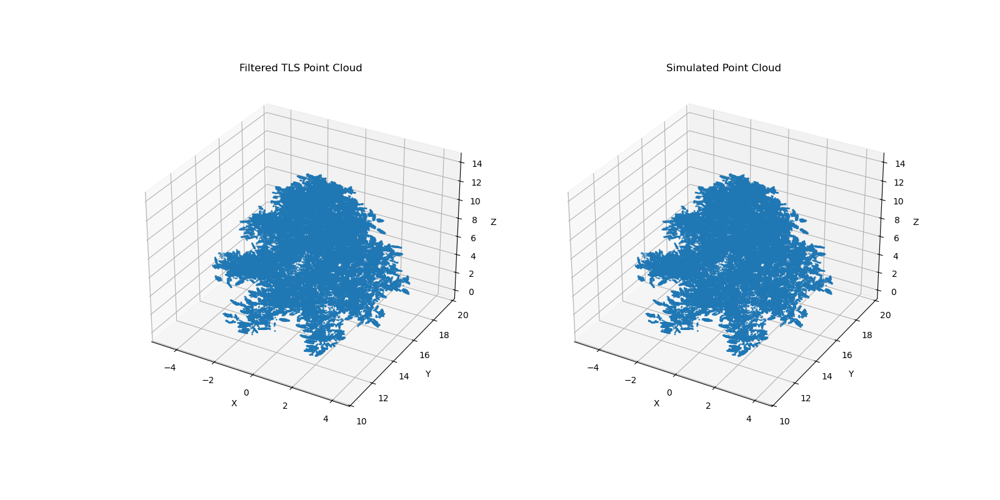

In [10]:
# thresholds the simulated point cloud to the same y range
point_cloud_sim = point_cloud_sim[point_cloud_sim[:,1] < y_threshold]
print(f"Points in simulated point cloud after Y thresholding: {point_cloud_sim.shape[0]}")

# plot both point clouds side by side for comparison
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(filtered_points[:,0], filtered_points[:,1], filtered_points[:,2], s=1)
ax1.set_title('Filtered TLS Point Cloud')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(point_cloud_sim[:,0], point_cloud_sim[:,1], point_cloud_sim[:,2], s=1)
ax2.set_title('Simulated Point Cloud')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Z')
plt.show()

Points after down sampling: 87452


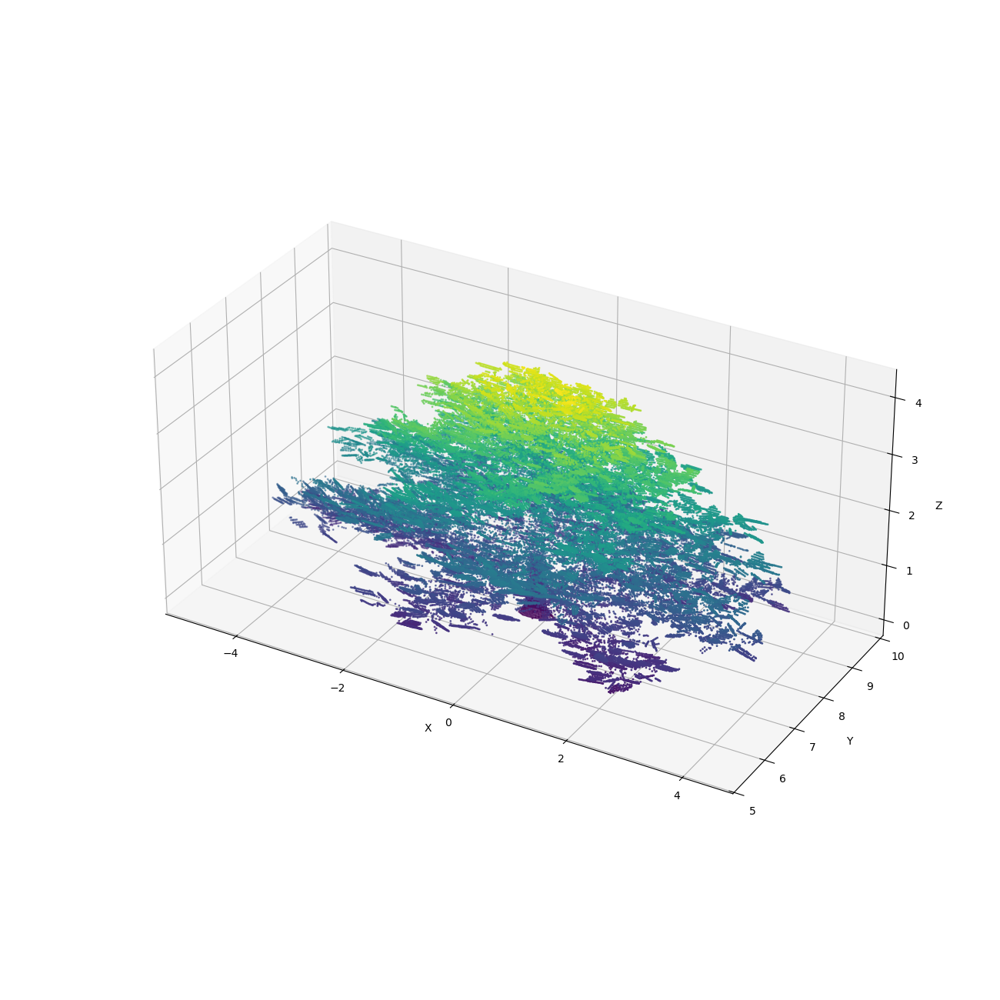

In [11]:
# down sampling the point clouds for faster processing
sample_ratio = 1  # keep 100% of points
num_points = filtered_points.shape[0]
sampled_indices = np.random.choice(num_points, size=int(num_points * sample_ratio), replace=False)
sampled_points = filtered_points[sampled_indices]

# compress the y values by 0.5 to make the point clouds denser in y direction
sampled_points[:,1] = sampled_points[:,1] * 0.5
# compress the z values by 0.7 to make the point clouds denser in z direction
sampled_points[:,2] = sampled_points[:,2] * 0.3

print(f"Points after down sampling: {sampled_points.shape[0]}")
# plot down sampled point clouds
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(111, projection='3d')
# color by z value
sc = ax.scatter(sampled_points[:,0], sampled_points[:,1], sampled_points[:,2], c=sampled_points[:,2], cmap='viridis', s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
# make all axes the same scale
ax.set_aspect('equal', adjustable='box')
# plt.colorbar(sc, ax=ax, label='Z value', shrink=0.3)
plt.show()

In [12]:
# point_cloud_sim [:,1] = point_cloud_sim[:,1] * 0.5
# point_cloud_sim [:,2] = point_cloud_sim[:,2] * 0.3

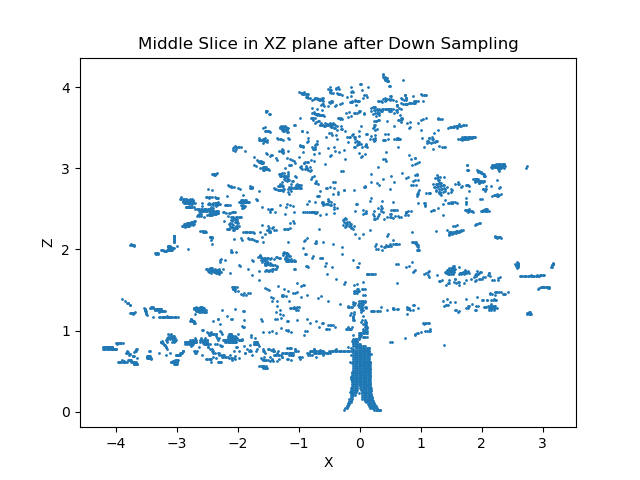

In [13]:
# check a slice in the middle
y_middle = (np.min(sampled_points[:,1]) + np.max(sampled_points[:,1])) / 2
slice_thickness = 0.1
middle_slice = sampled_points[(sampled_points[:,1] >= y_middle - slice_thickness/2) & (sampled_points[:,1] < y_middle + slice_thickness/2)]
plt.figure()
plt.scatter(middle_slice[:,0], middle_slice[:,2], s=1)
plt.title('Middle Slice in XZ plane after Down Sampling')
plt.xlabel('X')
plt.ylabel('Z')
plt.show()

# the slice looks good, the distance of points between the z and x direction are comparable now.

In [14]:
# # show some slices along the x axis
# x_min = np.min(sampled_points[:,0])
# x_max = np.max(sampled_points[:,0])
# slice_thickness = 0.5
# x = x_min
# while x < x_max:
#     slice_points = sampled_points[(sampled_points[:,0] >= x) & (sampled_points[:,0] < x + slice_thickness)]
#     plt.figure()
#     plt.scatter(slice_points[:,1], slice_points[:,2], s=1)
#     plt.title(f'Slice along X axis from {x:.2f} to {x + slice_thickness:.2f} in YZ plane')
#     plt.xlabel('Y')
#     plt.ylabel('Z')
#     plt.xlim(np.min(sampled_points[:,1]), np.max(sampled_points[:,1]))
#     plt.ylim(np.min(sampled_points[:,2]), np.max(sampled_points[:,2]))
#     plt.show()
#     x += slice_thickness
# # we can see that it does well in some areas, but in some areas, leaves are still merged together or cut into different clusters.
# # this is because

# Finding leaf clusters

We can see that the distance between points are not uniform across the tree. It is affected by:
1. The distance from the LiDAR scanner to the leaf surface.
2. The angle between the leaf surface normal and the direction from the LiDAR scanner to the leaf surface.

DBSCAN requires a fixed distance threshold (eps) to cluster points. Therefore, we will cut the tree into smaller clusters first, then apply DBSCAN on each smaller cluster with an appropriate eps value.

## Clustering the tree into smaller clusters

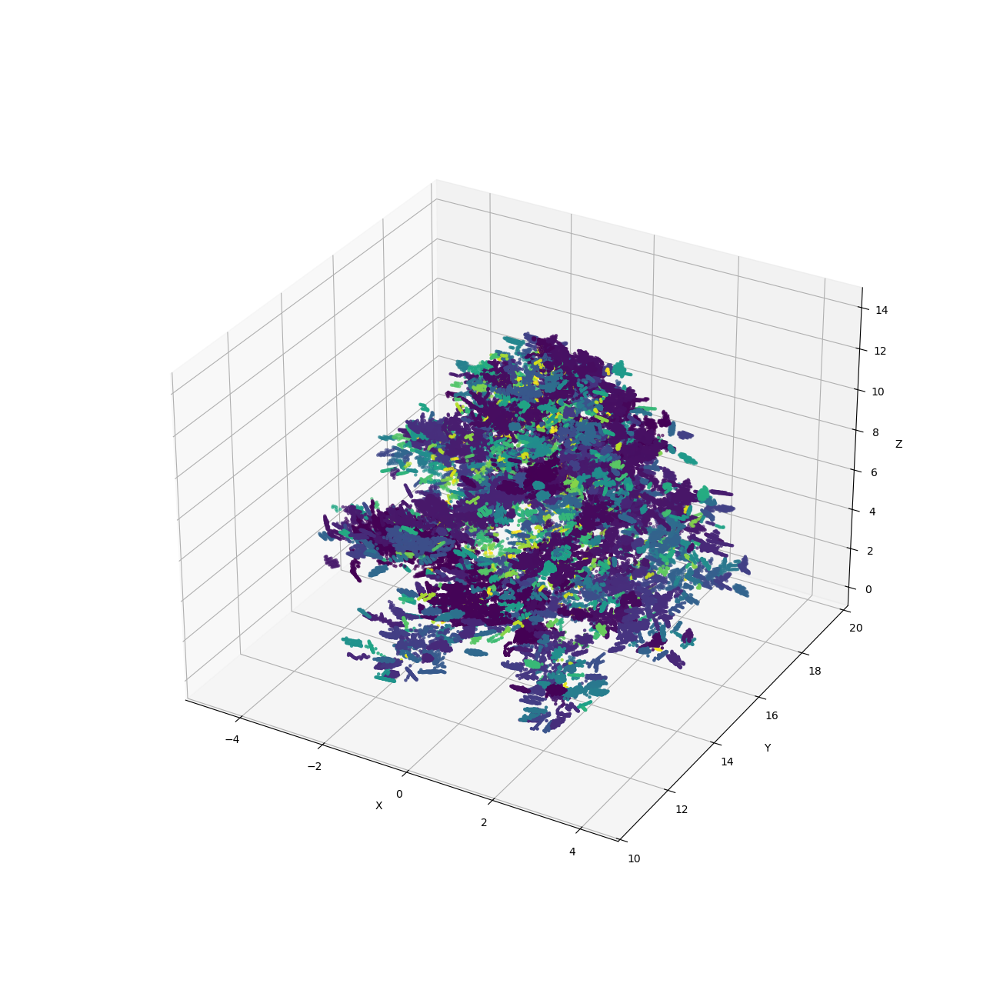

In [15]:
# use DBSCAN to create clusters of points (branches and leaves)
from sklearn.cluster import DBSCAN

# initial cluster
y_scale = 1
scaled_points = sampled_points.copy()
scaled_points[:,1] = scaled_points[:,1] * y_scale
eps = 0.07
dbscan = DBSCAN(eps=eps, min_samples=5, n_jobs=14)
labels = dbscan.fit_predict(scaled_points)
num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

# plot clusters with different colors
fig = plt.figure(figsize=(13,13))
ax = fig.add_subplot(111, projection='3d')  
# remove points which belong to no cluster (label = -1)
valid_indices = labels != -1
sampled_points_plot = scaled_points[valid_indices]
labels_plot = labels[valid_indices] 
sc = ax.scatter(sampled_points_plot[:,0], sampled_points_plot[:,1]/0.5, sampled_points_plot[:,2]/0.3, c=labels_plot, cmap='viridis', s=5)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
# make all axes the same scale
# ax.set_aspect('equal', adjustable='box')
# plt.colorbar(sc, ax=ax, label='Cluster Label', shrink=0.3)
plt.show()

# Some initial clustering inspection

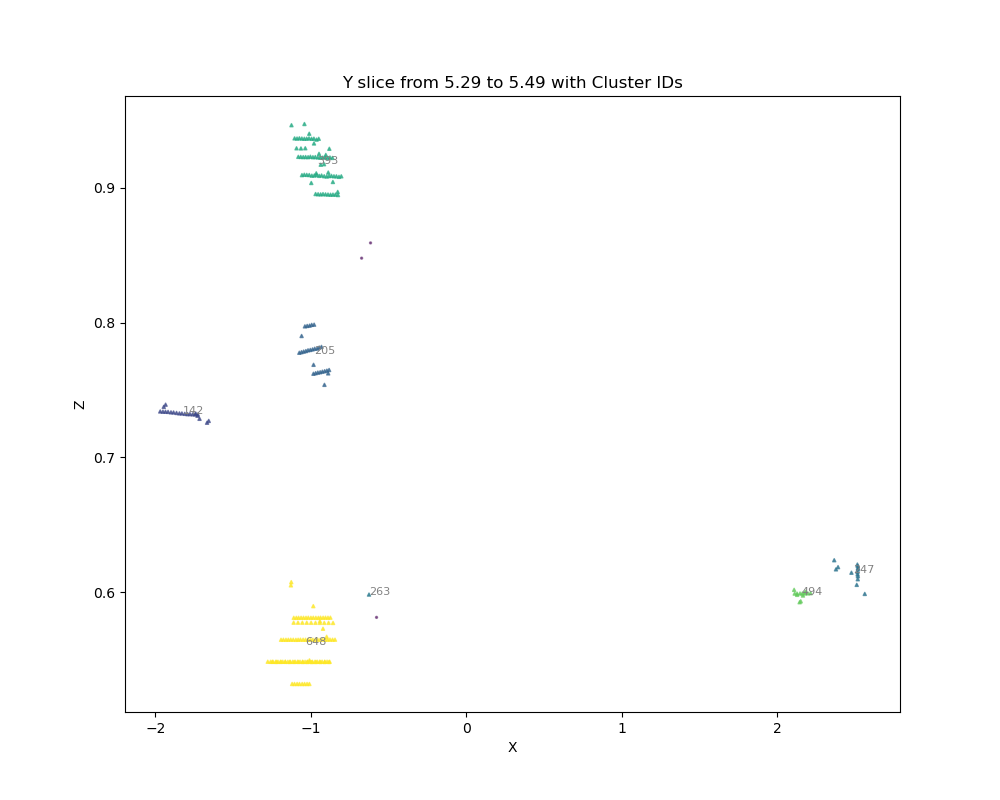

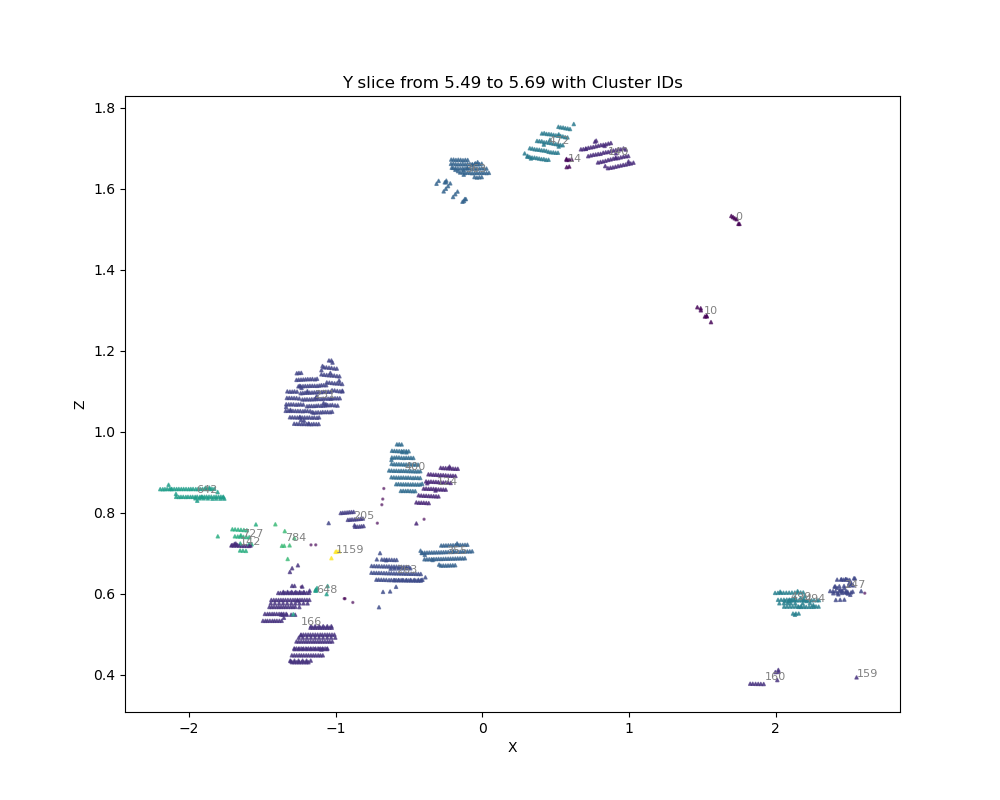

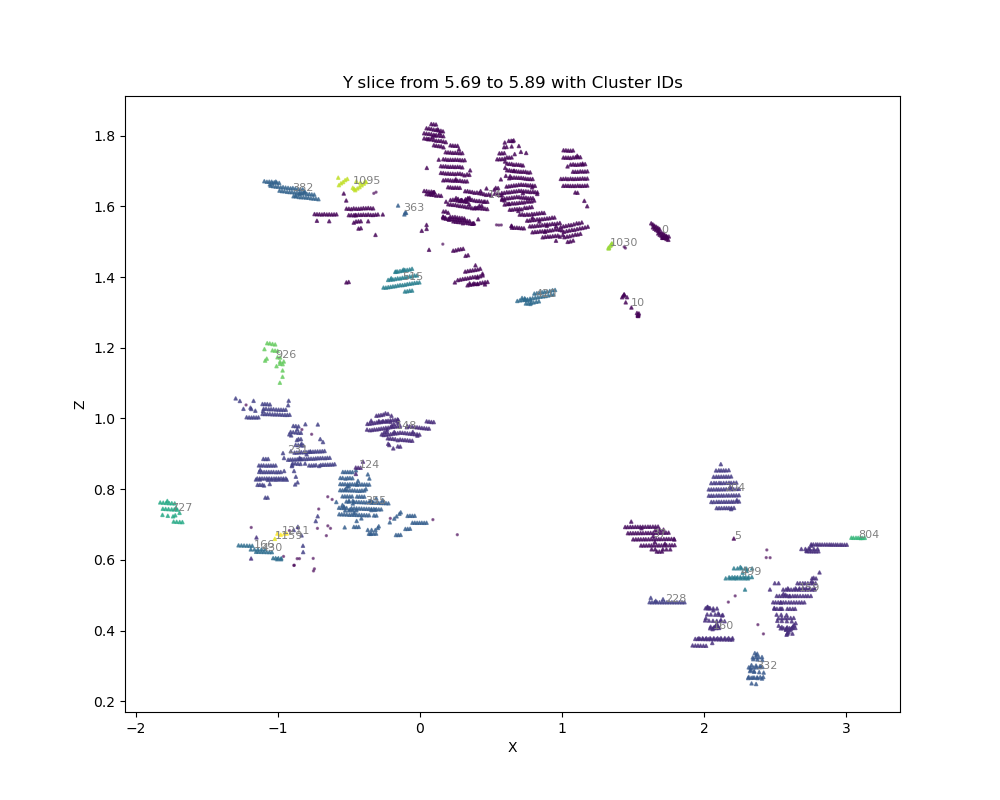

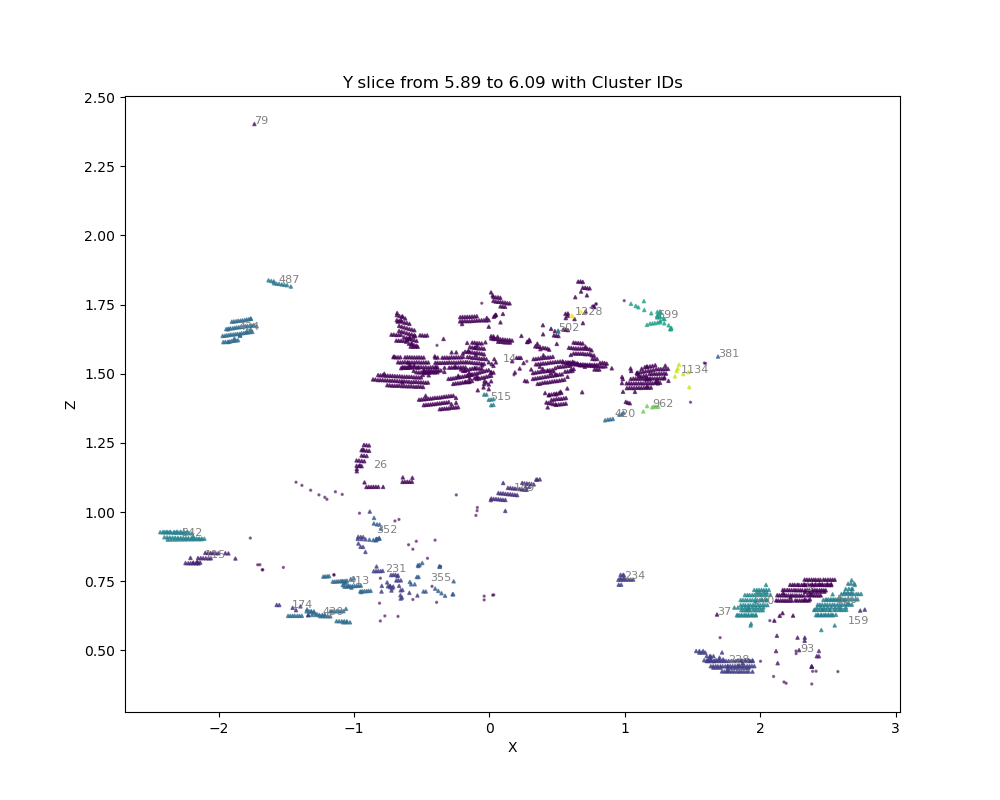

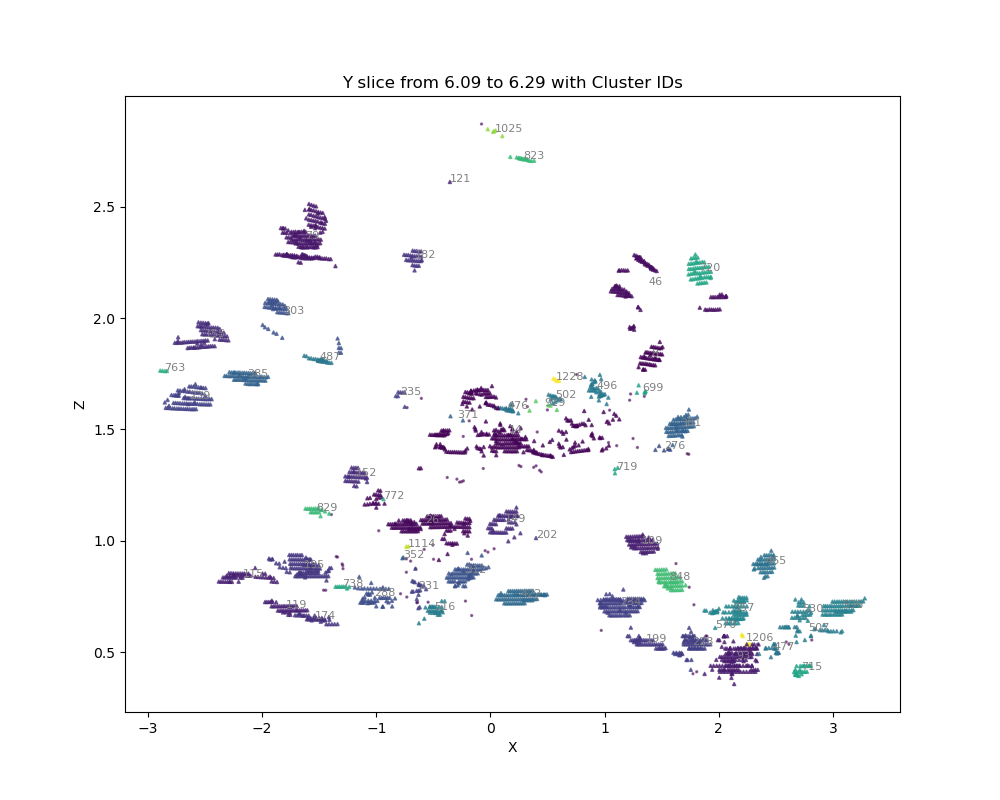

...

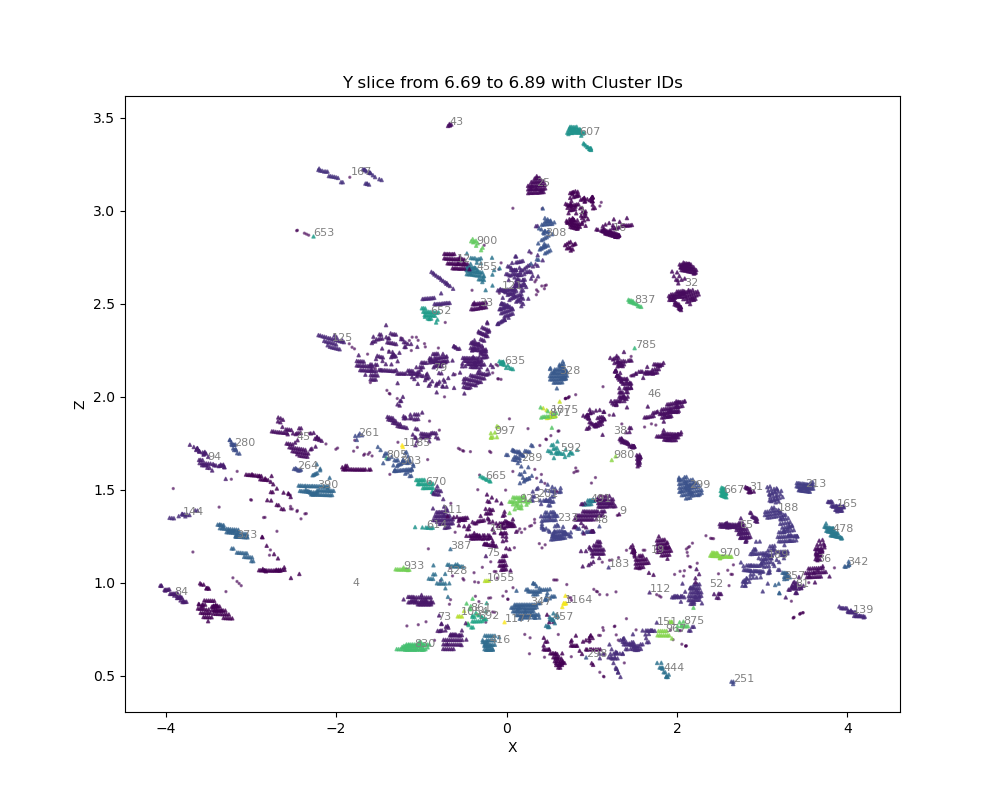

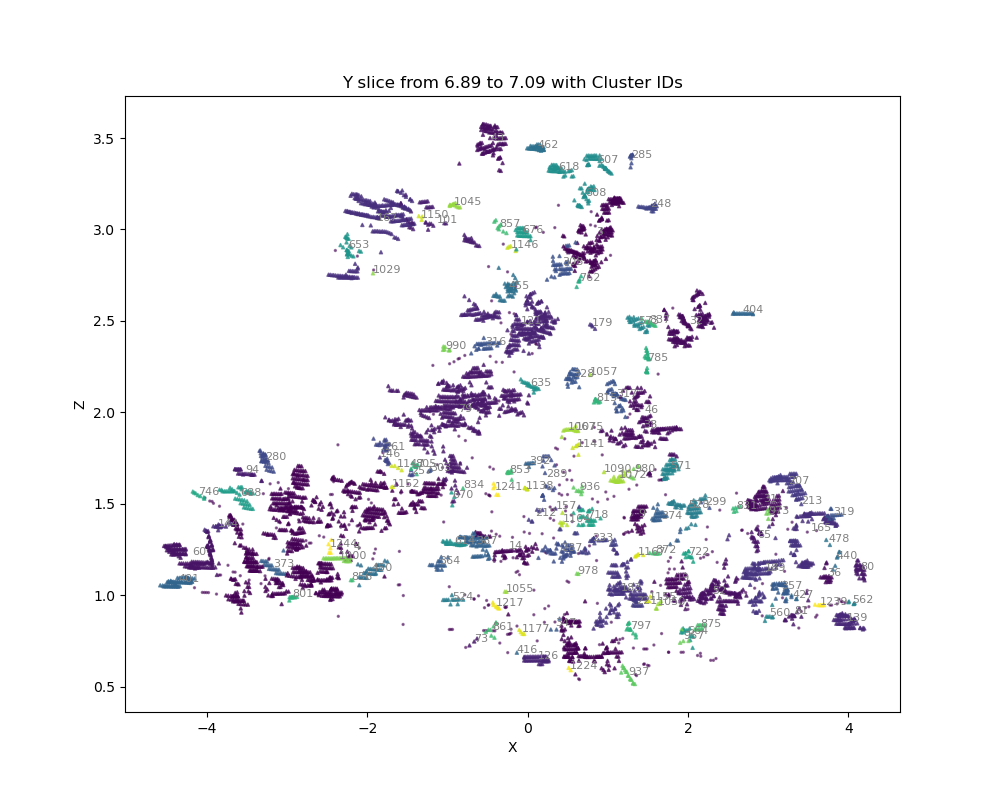

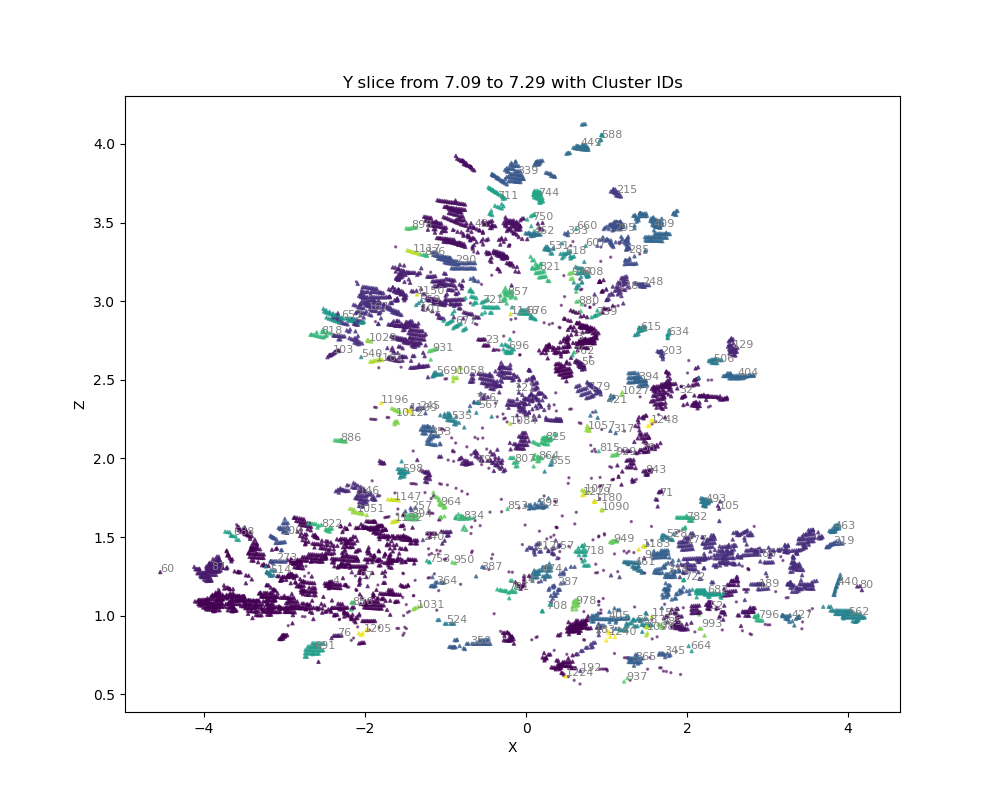

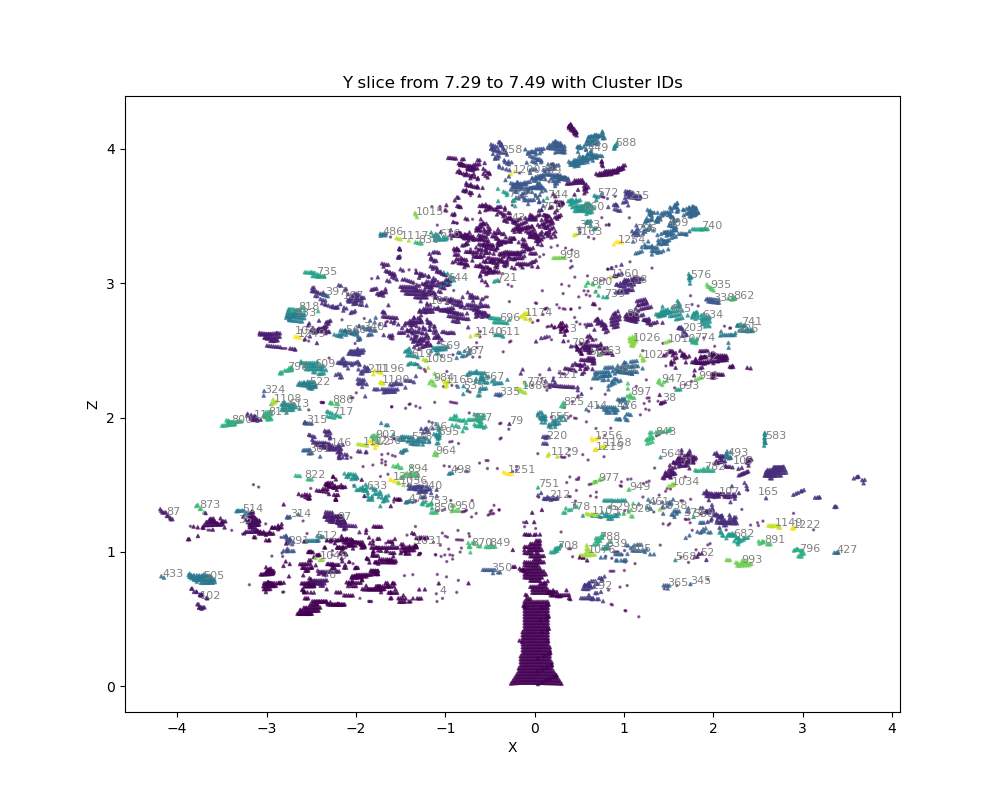

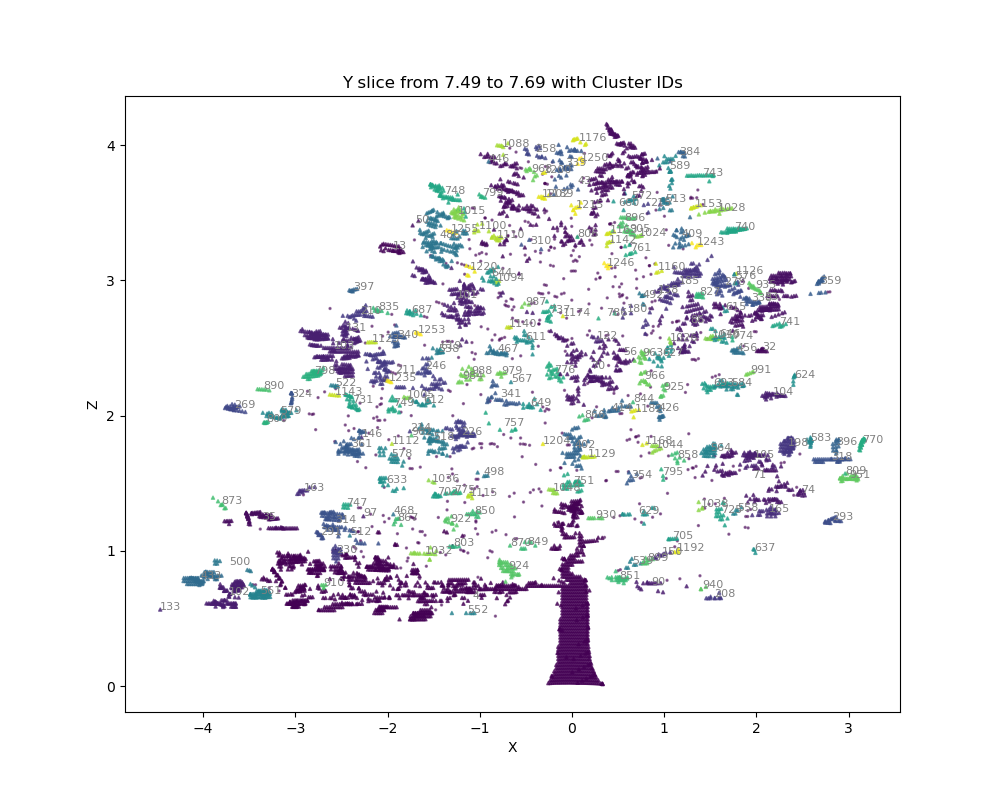

/tmp/ipykernel_265920/814180353.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


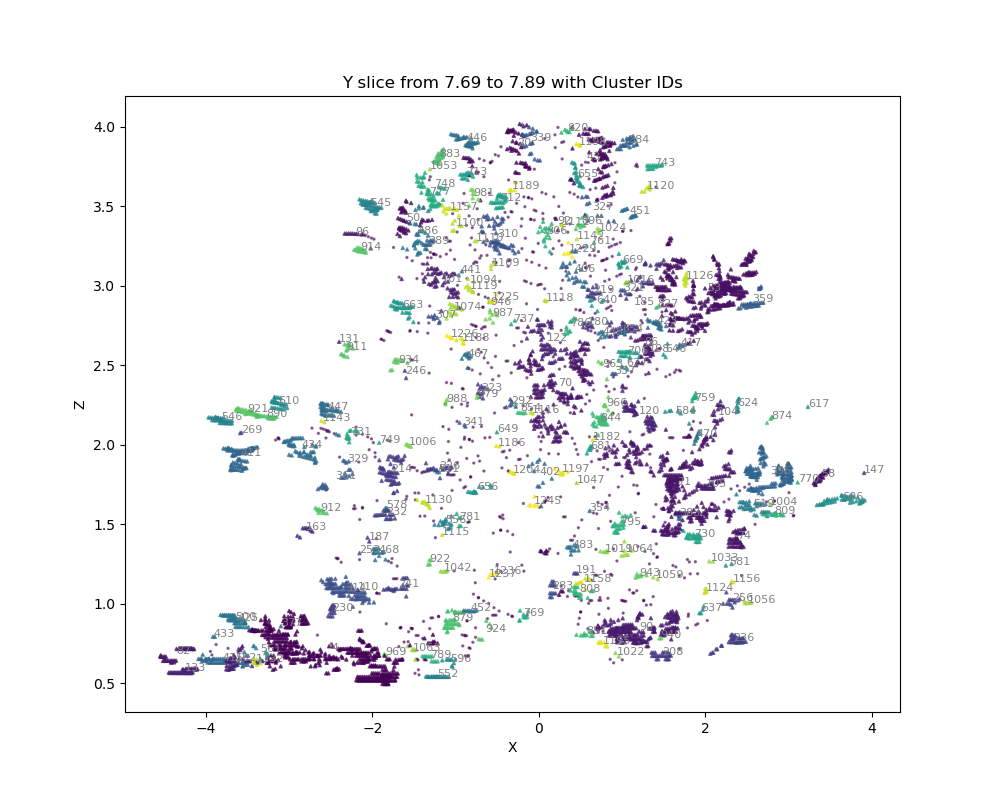

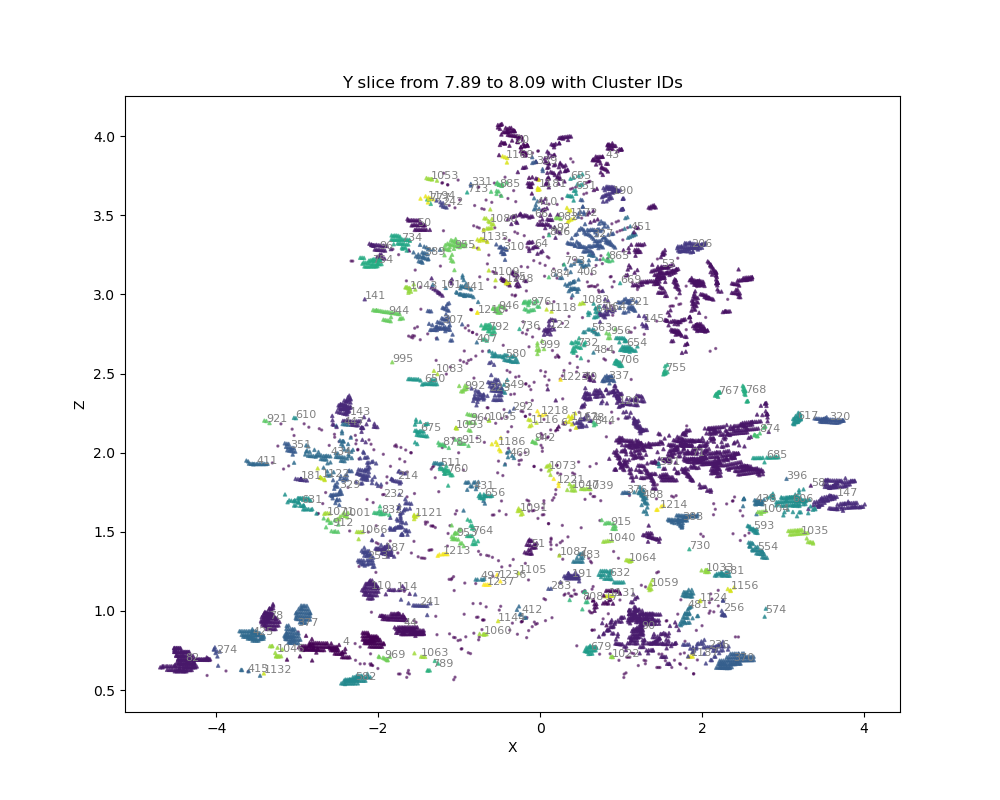

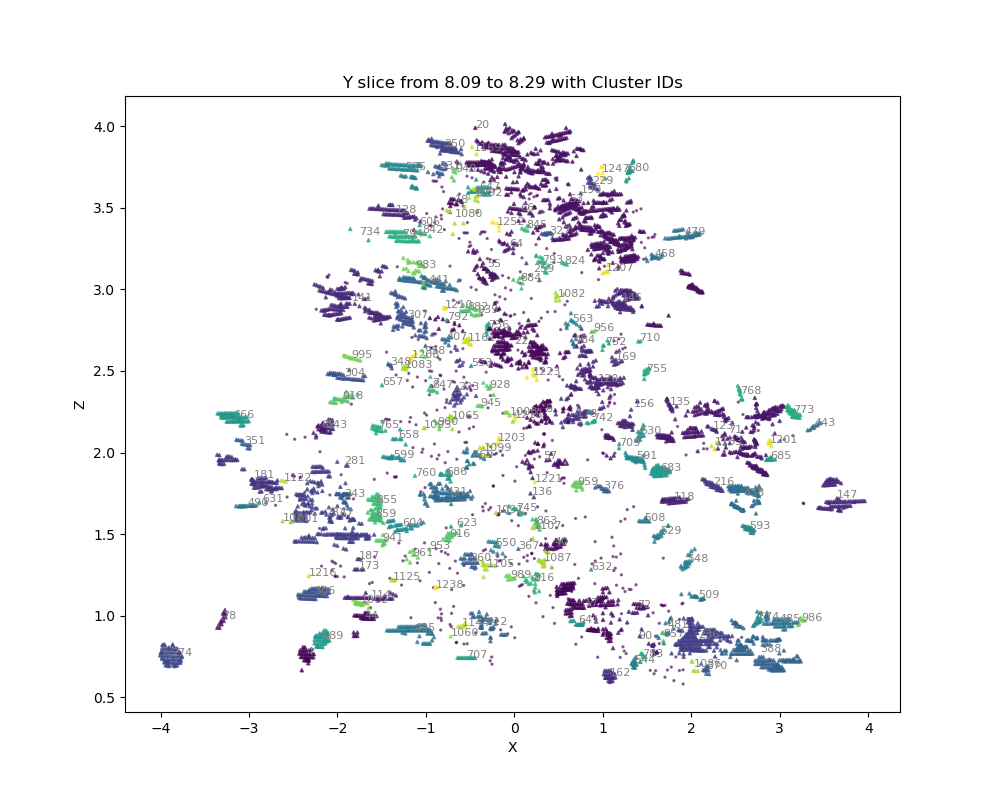

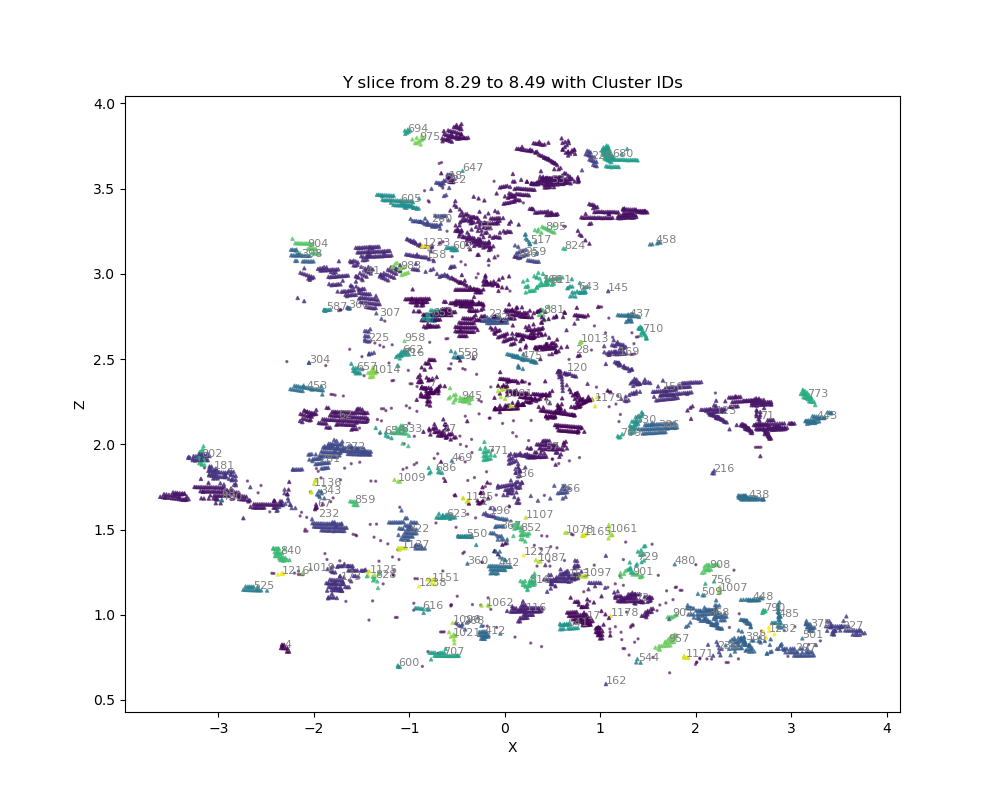

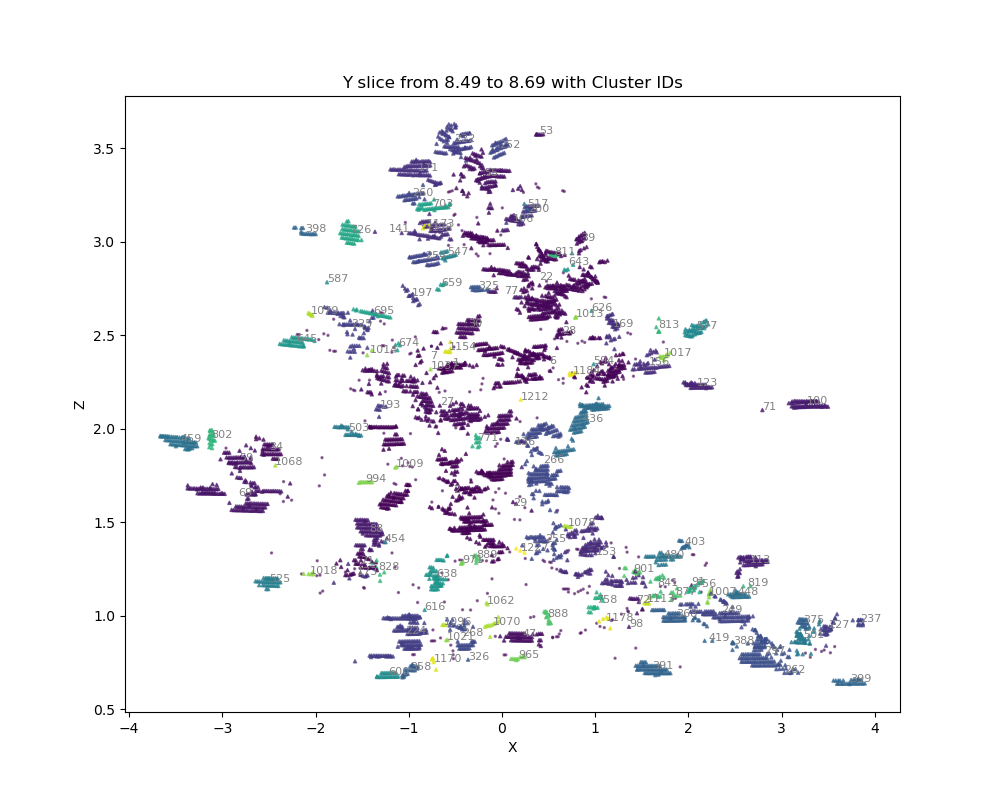

...

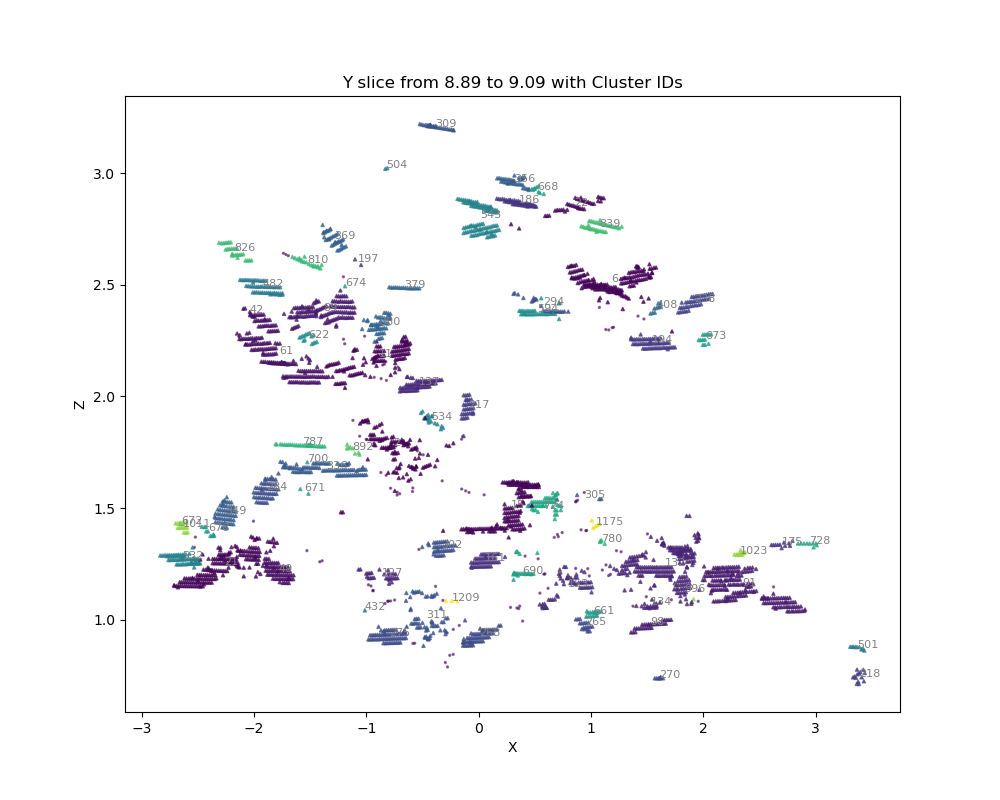

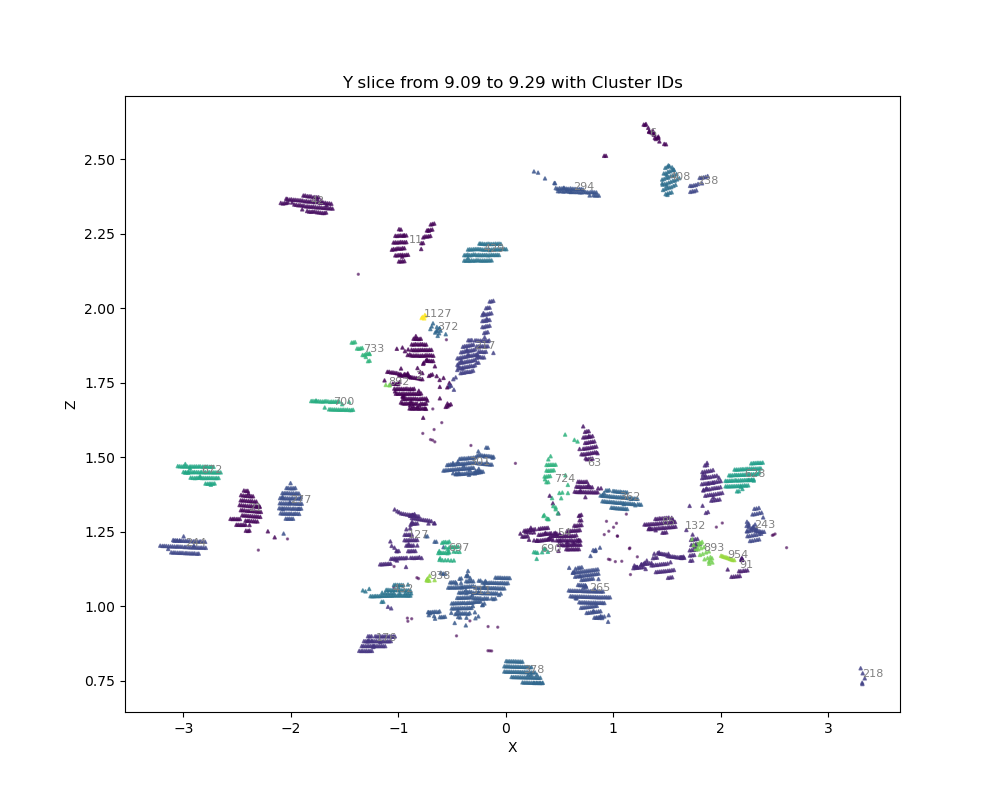

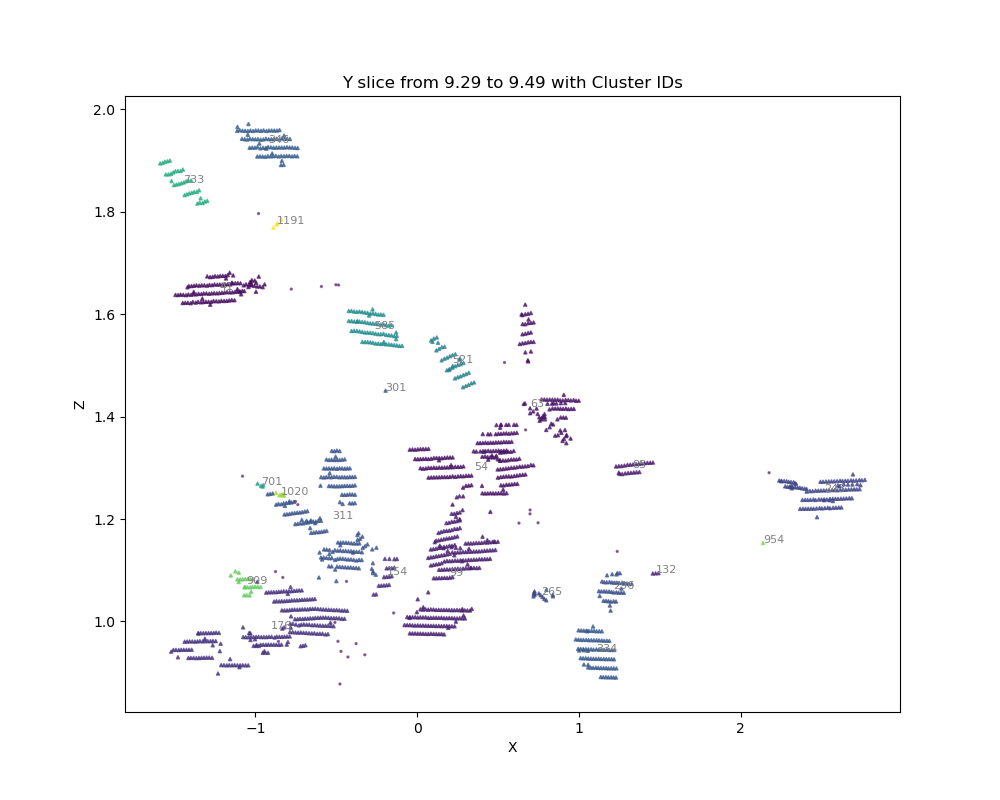

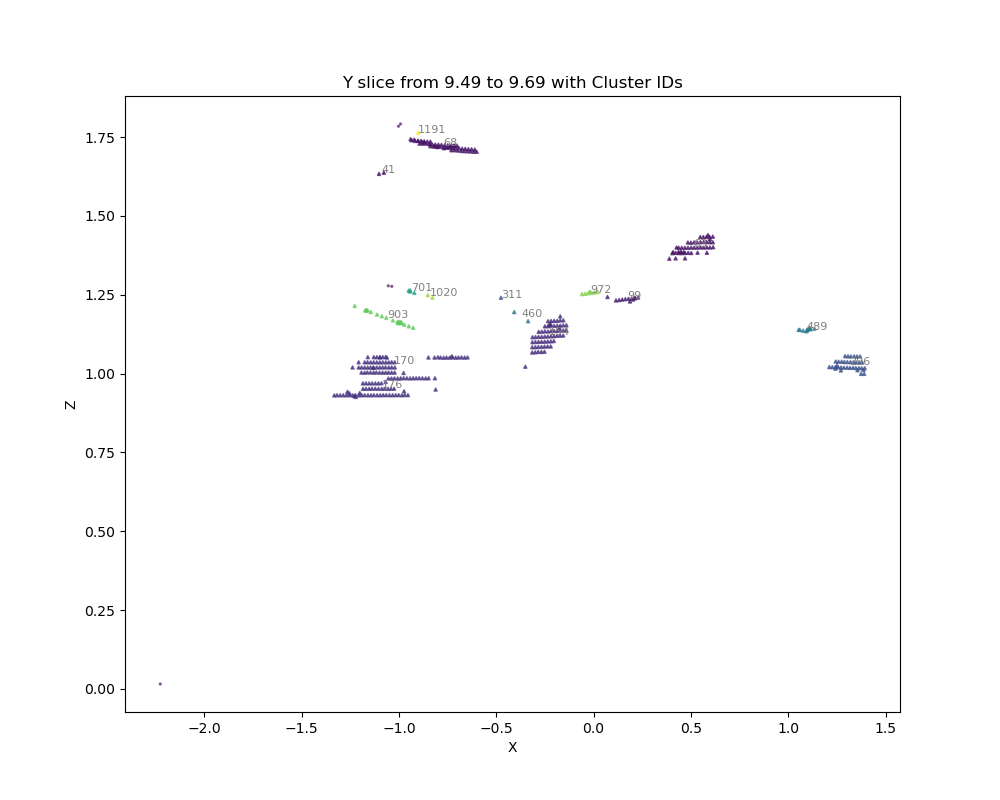

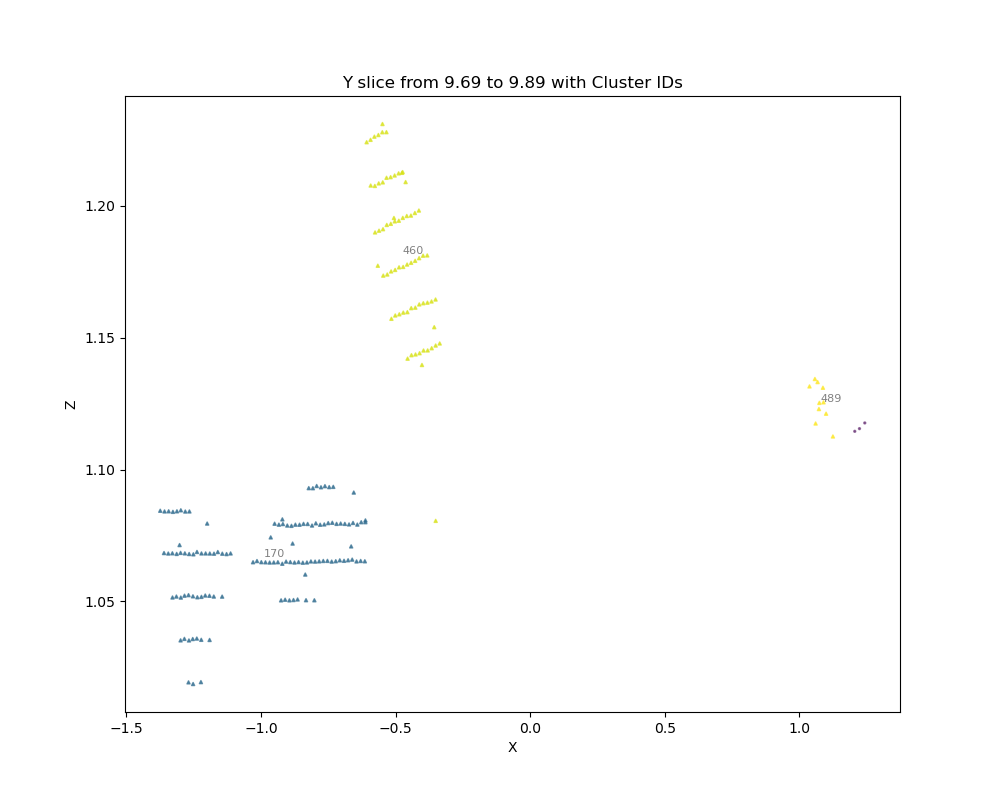

In [16]:
# plot ct scan long the y axis and also add cluster ids
y_slices = np.arange(np.min(scaled_points[:,1]), np.max(scaled_points[:,1]), 0.2)
for y_slice in y_slices:
    slice_points = scaled_points[(scaled_points[:,1] >= y_slice) & (scaled_points[:,1] < y_slice + 0.2)]
    slice_labels = labels[(scaled_points[:,1] >= y_slice) & (scaled_points[:,1] < y_slice + 0.2)]
    
    fig, ax = plt.subplots(figsize=(10, 8))
    
    slice_points_plot = slice_points[:, [0, 2]]  # plot x and z coordinates
    slice_labels_plot = slice_labels
    # remove leaf points with area > threshold
    leaf_indices = slice_labels_plot != -1
    non_leaf_indices = ~leaf_indices    
    colors_plot = np.array([plt.cm.viridis(label / np.max(slice_labels_plot)) for label in slice_labels_plot])
    ax.scatter(slice_points_plot[non_leaf_indices,0], slice_points_plot[non_leaf_indices,1], c=colors_plot[non_leaf_indices], s=2, alpha=0.5)
    ax.scatter(slice_points_plot[leaf_indices,0], slice_points_plot[leaf_indices,1], c=colors_plot[leaf_indices], s=5, marker='^', alpha=0.7)
    # show cluster ids
    for label in set(slice_labels_plot):
        if label == -1:
            continue
        label_indices = slice_labels_plot == label
        if np.sum(label_indices) == 0:
            continue
        mean_x = np.mean(slice_points_plot[label_indices,0])
        mean_z = np.mean(slice_points_plot[label_indices,1])
        ax.text(mean_x, mean_z, str(label), color='gray', fontsize=8, alpha=1)
    ax.set_xlabel('X')
    ax.set_ylabel('Z')
    plt.title(f'Y slice from {y_slice:.2f} to {y_slice + 0.2:.2f} with Cluster IDs')
    plt.show()

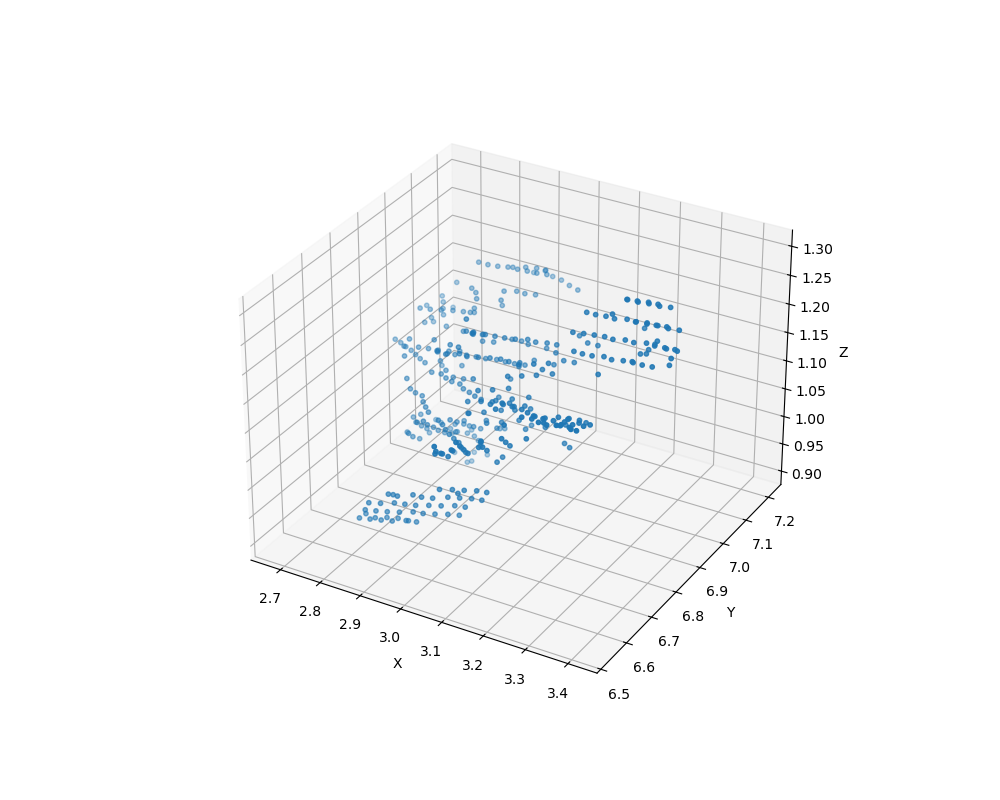

In [17]:
# inspect a specific cluster
cluster_id_to_inspect = 189
cluster_points = sampled_points[labels == cluster_id_to_inspect]
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')  
ax.scatter(cluster_points[:,0], cluster_points[:,1], cluster_points[:,2], s=10)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()  

## For each smaller cluster, find leaf clusters using DBSCAN, RANSAC and shape analysis

In [18]:

# for each large cluster, find the best y_scale, z_scale to maximize the number of leaf-like clusters

from sklearn.decomposition import PCA
from sklearn.linear_model import RANSACRegressor, LinearRegression

# analyze the shape of clusters, we want the shape that characterize leaves best
def analyze_cluster_shape(points):
    """Analyze the shape of a cluster of points using PCA."""
    if points.shape[0] < 3:
        return 0.0, 0.0, 0.0  # not enough points to analyze shape
    
    # get linearality, planarity, sphericity
    pca = PCA(n_components=3)
    pca.fit(points)
    eigenvalues = pca.explained_variance_
    total_variance = np.sum(eigenvalues)
    linearity = (eigenvalues[0] - eigenvalues[1]) / total_variance
    planarity = (eigenvalues[1] - eigenvalues[2]) / total_variance
    sphericity = eigenvalues[2] / total_variance
    return linearity, planarity, sphericity

# leaf-like clusters are defined as clusters with size between certain sizes, and planarity > linearity and sphericity
def cluster_is_leaf_like(cluster_points, min_points=10, max_points=80, min_ratio=20, plane_threshold=0.02):
    """
        Determine if a cluster of points is leaf-like based on size and shape criteria.
    """
    def points_lie_in_a_plane_criteria(points, threshold=0.02):
        # fit a 3D line to the points using linear regression
        lm = LinearRegression()
        lm.fit(points[:, :2], points[:, 2])
        # all point should be within a certain distance to the line, threshold = 0.02
        predicted_z = lm.predict(points[:, :2])
        distances = np.abs(points[:, 2] - predicted_z)
        if np.all(distances < threshold):
            return True
        return False
    
    linearity, planarity, sphericity = analyze_cluster_shape(cluster_points)
    ratio = planarity / (sphericity + 1e-7)
    is_on_plane = points_lie_in_a_plane_criteria(cluster_points, threshold=plane_threshold)
    if cluster_points.shape[0] >= min_points and cluster_points.shape[0] <= max_points and ratio >= min_ratio and is_on_plane:
        return True, linearity, planarity, sphericity
    return False, linearity, planarity, sphericity


def score_function(points, labels, min_points=10, max_points=80, min_ratio=20, plane_threshold=0.02):
    """
        Receive some clustered points and their labels
        and return a score based on quantity and quality of leaf-like clusters found
    """
    leaf_cluster_id_2_stats = {}
    for cluster_label in set(labels):
        if cluster_label == -1:
            continue  # skip noise
        cluster_points = points[labels == cluster_label]
        is_leaf, linearity, planarity, sphericity = cluster_is_leaf_like(cluster_points, 
                                                                         min_points=min_points, 
                                                                         max_points=max_points, 
                                                                         min_ratio=min_ratio,
                                                                         plane_threshold=plane_threshold)
        if is_leaf:
            leaf_cluster_id_2_stats[cluster_label] = (linearity, planarity, sphericity)
            
    # score is planarity * number of points in each leaf-like cluster
    score = 0
    for cluster_label, stats in leaf_cluster_id_2_stats.items():
        planarity = stats[1]
        num_points = np.sum(labels == cluster_label)
        # score += num_points**2 * planarity
        score += num_points**2
    return score, leaf_cluster_id_2_stats


def DBSCAN_cluster_optimization(cluster_points, min_points=15, max_points=80, min_ratio=10, 
                                y_scale_min=0.5, y_scale_max=2.5, y_scale_step=0.2, 
                                z_scale_min=0.5, z_scale_max=2.5, z_scale_step=0.2, plane_threshold=0.02):
    """
        Receive some clustered points and try different DBSCAN parameters to find the best clustering
        that maximizes the score_function.
    
    returns: best_score, best_num_leaf_clusters, clustering_assignment, leaf_label_set
    
    clustering_assignment: array of cluster labels for each point in cluster_points
    leaf_label_set: set of cluster labels that are considered leaf-like
    best_score: highest score achieved
    best_num_leaf_clusters: number of leaf-like clusters found at best score
    """
    # try different y_scale and z_scale to scale the cluster points using DBSCAN to find subclusters
    # score the subclusters based on the number of leaf-like clusters found
    best_score = -1
    best_num_leaf_clusters = 0
    clustering_assignment = -1 * np.ones(cluster_points.shape[0], dtype=int)
    leaf_label_set = set()

    list_eps = np.arange(0.1, 0.01, -0.005)
    list_min_samples = [5, 10, 15, 20]
    
    for min_samples in list_min_samples:
        for eps in list_eps:

            scaled_points = cluster_points.copy()
            dbscan = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=16)
            labels = dbscan.fit_predict(scaled_points)
            
            # # the number of points in -1 cluster should be less than 20% of total points
            num_noise_points = np.sum(labels == -1)
            if num_noise_points > 0.2 * scaled_points.shape[0]:
                continue  # skip this scale
            
            # use ransac to remove points that are not on planes?
            # for each cluster, fit a plane using ransac, keep only inlier points
            for label in set(labels):
                if label == -1: # don't process noise
                    continue
                cluster_points_ransac = scaled_points[labels == label]
                if cluster_points_ransac.shape[0] < 3:
                    continue
                ransac = RANSACRegressor(residual_threshold=plane_threshold, min_samples=3, max_trials=300)
                X = cluster_points_ransac[:, :2]  # use x and y as input
                y = cluster_points_ransac[:, 2]    # use z as output
                ransac.fit(X, y)
            
                inlier_mask = ransac.inlier_mask_
                cluster_points_ransac = cluster_points_ransac[inlier_mask]
                # update labels
                labels_indices = np.where(labels == label)[0]
                for i, idx in enumerate(labels_indices):
                    if not inlier_mask[i]:
                        # remove outlier point
                        labels[idx] = -1  # mark as noise

            # # check noise again
            # # # the number of points in -1 cluster should be less than 20% of total points
            # num_noise_points = np.sum(labels == -1)
            # if num_noise_points > 0.3 * scaled_points.shape[0]:
            #     continue  # skip this scale
            
            score, leaf_cluster_id_2_stats = score_function(scaled_points, labels, min_points=min_points, 
                                                        max_points=max_points, min_ratio=min_ratio, 
                                                        plane_threshold=plane_threshold)
            
            if score > best_score or (np.abs(score - best_score) <= 5 and len(leaf_cluster_id_2_stats) > best_num_leaf_clusters):
                best_score = score
                best_num_leaf_clusters = len(leaf_cluster_id_2_stats)
                leaf_label_set = set(leaf_cluster_id_2_stats.keys())
                # outlier points are labeled as -1 
                clustering_assignment = labels.copy()
            
    return best_score, best_num_leaf_clusters, clustering_assignment, leaf_label_set


# implementing sequential RANSAC to find 2d leaf planes in 3d point clouds
def RANSAC_cluster_optimization(cluster_points, distance_threshold=0.01, min_inliers=20, 
                                dbscan_min_points=15, dbscan_max_points=80, dbscan_min_ratio=10, 
                                dbscan_plane_threshold=0.02):
    remaining_points = cluster_points.copy()
    leaf_planes = []
    
    list_len_remaining = []
    while remaining_points.shape[0] >= min_inliers:
        # fit RANSAC plane model
        ransac = RANSACRegressor(residual_threshold=distance_threshold, min_samples=3, max_trials=300)
        X = remaining_points[:, :2]  # use x and y as input
        y = remaining_points[:, 2]    # use z as output
        ransac.fit(X, y)
        
        inlier_mask = ransac.inlier_mask_
        inlier_points = remaining_points[inlier_mask]
        
        # there can be multiple cluster in inlier points so we want to separate them
        # use DBSCAN to separate them, find the best DBSCAN clustering and remove good clusters.
        best_score, best_num_leaf_clusters, clustering_assignment, leaf_label_set = DBSCAN_cluster_optimization(inlier_points,
                                                                                                       min_points=dbscan_min_points, 
                                                                                                       max_points=dbscan_max_points, 
                                                                                                       min_ratio=dbscan_min_ratio, 
                                                                                                       plane_threshold=dbscan_plane_threshold)
        
        # # set inlier_points to only those points that are labeled as leaf-like clusters
        for cluster_id in leaf_label_set:
            cluster_points = inlier_points[clustering_assignment == cluster_id]
            # if cluster_points.shape[0] >= min_inliers:
            leaf_planes.append(cluster_points)
                
        new_inlier_mask = list()
        inlier_points_pos = 0
        for i in range(inlier_mask.shape[0]):
            if inlier_mask[i]:
                if clustering_assignment[inlier_points_pos] in leaf_label_set:
                    new_inlier_mask.append(True)
                else:
                    new_inlier_mask.append(False)
                inlier_points_pos += 1
            else:
                new_inlier_mask.append(False)
        
        # remove inliers from remaining points
        outlier_mask = np.logical_not(new_inlier_mask)
        remaining_points = remaining_points[outlier_mask]
        
        len_remaining = remaining_points.shape[0]
        list_len_remaining.append(len_remaining)
        # if 3 time and still no change, break
        if len(list_len_remaining) >= 5:
            if all(x == list_len_remaining[-1] for x in list_len_remaining[-3:]):
                break
    
    return leaf_planes


param_1 = {
    # use with optimal number of leaf-like clusters objective
    'dbscan':{
        'min_points':12,
        'max_points':70,
        'min_ratio':20,
        'plane_threshold':0.04,
    },
    'ransac':{
        'distance_threshold':0.04,
        'min_inliers':12,
        'dbscan_min_points':12,
        'dbscan_max_points':70,
        'dbscan_min_ratio':20,
        'dbscan_plane_threshold':0.04,
    }
} # very good cluster, ~430 clusters, but failed to split some leaves

param_2 = {
    # use with optimal number of leaf-like clusters objective
    'dbscan':{
        'min_points':15,
        'max_points':80,
        'min_ratio':20,
        'plane_threshold':0.015
    },
    'ransac':{
        'distance_threshold':0.02,
        'min_inliers':15,
        'dbscan_min_points':12,
        'dbscan_max_points':80,
        'dbscan_min_ratio':20
    }
}
param = param_1


def optimize_for_cluster(cluster_points, ransac_only=False):
    """
    This function should return the best subclustering labels for the given cluster points
    1. Try different y_scale and z_scale to scale the cluster points using DBSCAN to find subclusters
    2. Score the subclusters based on the number of leaf-like clusters found
    3. If number of leaf-like clusters is 0, try sequential RANSAC to find leaf planes
    4. Return the best clustering assignment.
    """
    # try DBSCAN first
    best_score = -1
    clustering_assignment = -1 * np.ones(cluster_points.shape[0], dtype=int)
    leaf_label_set = set()
    best_num_leaf_clusters = 0
    if not ransac_only:
        best_score, best_num_leaf_clusters,\
            clustering_assignment,\
                leaf_label_set = DBSCAN_cluster_optimization(cluster_points,
                                                            min_points=param['dbscan']['min_points'], 
                                                            max_points=param['dbscan']['max_points'], 
                                                            min_ratio=param['dbscan']['min_ratio'], 
                                                            plane_threshold=param['dbscan']['plane_threshold'])

    
    # # Try RANSAC
    best_leaf_planes = []
    scaled_points = cluster_points.copy()
    leaf_planes = RANSAC_cluster_optimization(scaled_points, distance_threshold=param['ransac']['distance_threshold'], 
                                          min_inliers=param['ransac']['min_inliers'], 
                                            dbscan_min_points=param['ransac']['dbscan_min_points'], 
                                            dbscan_max_points=param['ransac']['dbscan_max_points'], 
                                            dbscan_min_ratio=param['ransac']['dbscan_min_ratio'],
                                            dbscan_plane_threshold=param['ransac']['dbscan_plane_threshold'])
    # score is total number of points in leaf planes
    score = sum(plane.shape[0]**2 for plane in leaf_planes)
    
    if score > best_score or (np.abs(score - best_score) <= 5 and len(leaf_planes) > best_num_leaf_clusters):
    # if len(leaf_planes) > best_num_leaf_clusters or (score > best_score and len(leaf_planes) == best_num_leaf_clusters):
        best_score = score
        best_num_leaf_clusters = len(leaf_planes)
        best_leaf_planes = leaf_planes
        
        # translate best_leaf_planes to clustering_assignment
        if len(best_leaf_planes) > 0:
            clustering_assignment = -1 * np.ones(cluster_points.shape[0], dtype=int)
            cluster_id = 0
            leaf_label_set = set()
            for plane in best_leaf_planes:
                for point in plane:
                    # find index of point in cluster_points
                    indices = np.where((np.round(cluster_points, decimals=4) == np.round(point, decimals=4)).all(axis=1))[0]
                    assert len(indices) > 0, "Point from leaf plane not found in original cluster points"
                    for index in indices:
                        clustering_assignment[index] = cluster_id
                leaf_label_set.add(cluster_id)
                cluster_id += 1
        print(f"After RANSAC: Best Score: {best_score}, Best Number of leaf-like clusters: {best_num_leaf_clusters}")
    else:
         print(f"After DBSCAN: Best Score: {best_score}, Best Number of leaf-like clusters: {best_num_leaf_clusters}")
                
    return best_score, best_num_leaf_clusters, clustering_assignment, leaf_label_set

In [19]:
# # try dbscan optimization the specific cluster
# cluster_id_to_inspect = 189
# cluster_points = sampled_points[labels == cluster_id_to_inspect]
# best_score, best_num_leaf_clusters, clustering_assignment, leaf_label_set = DBSCAN_cluster_optimization(cluster_points, plane_threshold=0.05, max_points=80)

In [20]:
# # plot cluster 14 with leaf-like clusters highlighted
# fig = plt.figure(figsize=(10, 8))
# ax = fig.add_subplot(111, projection='3d')  
# # for each cluster in leaf_label_set map cluster id to a color
# colors = []
# for i in range(clustering_assignment.shape[0]):
#     if clustering_assignment[i] in leaf_label_set:
#         colors.append(plt.cm.viridis(clustering_assignment[i] / np.max(list(leaf_label_set))))
#     else:
#         colors.append((0,0,0, 0.5))  # light gray for non-leaf clusters
# colors = np.array(colors)
# ax.scatter(cluster_points[:,0], cluster_points[:,1], cluster_points[:,2], c=colors, s=10)
# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_zlabel('Z')
# plt.show()

In [21]:
# best_score_ransac, best_num_leaf_clusters_ransac, clustering_assignment_ransac, leaf_label_set_ransac = optimize_for_cluster(
#     cluster_points, ransac_only=True)

# # plot ransac cluster 14 with leaf-like clusters highlighted
# fig = plt.figure(figsize=(10, 8))
# ax = fig.add_subplot(111, projection='3d')  
# # for each cluster in leaf_label_set map cluster id to a color
# colors_ransac = []
# for i in range(clustering_assignment_ransac.shape[0]):
#     if clustering_assignment_ransac[i] in leaf_label_set_ransac:
#         colors_ransac.append(plt.cm.viridis(clustering_assignment_ransac[i] / np.max(list(leaf_label_set_ransac))))
#     else:
#         colors_ransac.append((0,0,0, 0.5))  # light gray for non-leaf clusters
# colors_ransac = np.array(colors_ransac)
# ax.scatter(cluster_points[:,0], cluster_points[:,1], cluster_points[:,2], c=colors_ransac, s=10)
# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_zlabel('Z')
# plt.show()

In [22]:
cluster_id_2_best_scales = {}

In [23]:
# rewrite this loop to be parallel
from joblib import Parallel, delayed
def process_cluster(cluster_label, scaled_points, labels):
    if cluster_label == -1:
        return cluster_label, None  # skip noise
    cluster_points = scaled_points[labels == cluster_label]
    
    best_score, best_num_leaf_clusters, clustering_assignment, leaf_label_set = optimize_for_cluster(cluster_points)
    # print(f"Cluster {cluster_label}: Best Score (leaf-like clusters): {best_score}, Number of leaf-like clusters: {best_num_leaf_clusters}")
    return cluster_label, (best_score, best_num_leaf_clusters, clustering_assignment, leaf_label_set)
results = Parallel(n_jobs=16)(delayed(process_cluster)(cluster_label, scaled_points, labels) for cluster_label in set(labels))
cluster_id_2_best_scales = {cluster_label: result for cluster_label, result in results if result is not None}

After DBSCAN: Best Score: 400, Best Number of leaf-like clusters: 1
After DBSCAN: Best Score: 1296, Best Number of leaf-like clusters: 1
After DBSCAN: Best Score: 2116, Best Number of leaf-like clusters: 1
After DBSCAN: Best Score: 2116, Best Number of leaf-like clusters: 1
After DBSCAN: Best Score: 576, Best Number of leaf-like clusters: 1
After DBSCAN: Best Score: 1156, Best Number of leaf-like clusters: 1
After RANSAC: Best Score: 5024, Best Number of leaf-like clusters: 2
After DBSCAN: Best Score: 484, Best Number of leaf-like clusters: 1
After DBSCAN: Best Score: 0, Best Number of leaf-like clusters: 0
After RANSAC: Best Score: 5044, Best Number of leaf-like clusters: 2
After DBSCAN: Best Score: 2401, Best Number of leaf-like clusters: 1
After DBSCAN: Best Score: 5850, Best Number of leaf-like clusters: 3
After RANSAC: Best Score: 1147, Best Number of leaf-like clusters: 4
After RANSAC: Best Score: 6418, Best Number of leaf-like clusters: 3
After DBSCAN: Best Score: 2500, Best Num

In [24]:
# estimate number of leaves
total_num_leaves = 0
for cluster_label, (best_score, best_num_leaf_clusters, clustering_assignment, leaf_label_set) in cluster_id_2_best_scales.items():
    total_num_leaves += best_num_leaf_clusters
print(f"Estimated total number of leaves: {total_num_leaves*2}")

Estimated total number of leaves: 3016


In [25]:
## dump cluster_id_2_best_scales to a file
# import pickle
# with open('cluster_id_2_best_scales_v9.pkl', 'wb') as f:
#     pickle.dump(cluster_id_2_best_scales, f)
    
# # dump all points and their cluster labels to a file
# import pandas as pd
# df = pd.DataFrame(scaled_points, columns=['X', 'Y', 'Z'])
# df['ClusterLabel'] = labels
# df.to_csv('scaled_points_with_clusters_v9.csv', index=False)

# # load cluster_id_2_best_scales from a file
# import pickle
# with open('cluster_id_2_best_scales_v8.pkl', 'rb') as f:
#     cluster_id_2_best_scales = pickle.load(f)
    
# # load all points and their cluster labels from a file
# import pandas as pd
# df = pd.read_csv('scaled_points_with_clusters_v8.csv')
# scaled_points = df[['X', 'Y', 'Z']].values
# labels = df['ClusterLabel'].values  

# Visualize the final result

In [26]:
# add sub-cluster labels to the main labels 
new_labels = -1 * np.ones_like(labels, dtype=int)
is_leaf_label = np.zeros_like(labels, dtype=bool)
cur_unique_label = 0
wood_cluster_id = -1
key_to_new_label = {}
for cluster_label in set(labels):
    if cluster_label == -1:
        continue  # skip noise
    cluster_points = scaled_points[labels == cluster_label]
    cluster_points_global_indices = np.where(labels == cluster_label)[0]
    
    if cluster_label in cluster_id_2_best_scales:
        best_score, best_num_leaf_clusters, sub_clustering_assignment, sub_leaf_label_set = cluster_id_2_best_scales[cluster_label]
        # if len(sub_leaf_label_set) == 0:
        #     print(f"Cluster {cluster_label} has no leaf-like subclusters, assigning new label to whole cluster")
        #     for global_index in cluster_points_global_indices:
        #         new_labels[global_index] = wood_cluster_id
        #         is_leaf_label[global_index] = False
        #     continue
        
        
        sub_labels = sub_clustering_assignment
        for i, point in enumerate(cluster_points):
            global_index = cluster_points_global_indices[i]
            # if sub_labels[i] == -1:
            #     continue  # skip noise
            label_key = "_".join((str(cluster_label), str(sub_labels[i] + 1)))
            if label_key not in key_to_new_label:
                key_to_new_label[label_key] = cur_unique_label
                cur_unique_label += 1
            new_labels[global_index] = key_to_new_label[label_key]
            is_leaf_label[global_index] = sub_labels[i] in sub_leaf_label_set
    else:
        print(f"Cluster {cluster_label} has no subclustering info, assigning new label to whole cluster")
        # there should be no such cluster

In [27]:
total_sub_leaf_clusters = 0
total_check = 0
for k, v in cluster_id_2_best_scales.items():
    total_sub_leaf_clusters += len(v[3])
    total_check += v[1]
print(f"Total unique clusters: {len(set(new_labels))}, Total sub leaf clusters from all large clusters: {total_sub_leaf_clusters}, Total check: {total_check}")

# check the new labels
unique_new_labels = set(new_labels)
print(f"Total unique sub-cluster labels: {len(unique_new_labels)}")
for label in unique_new_labels:
    is_leaf = is_leaf_label[new_labels == label]
    # assert is_leaf is either all True or all False
    if not (np.all(is_leaf) or not np.any(is_leaf)):
        print(f"Label {label} has mixed leaf labels: {is_leaf}")

Total unique clusters: 2778, Total sub leaf clusters from all large clusters: 1508, Total check: 1508
Total unique sub-cluster labels: 2778


In [28]:
# key_to_new_label

In [69]:
import random
unique_labels = np.unique(new_labels)
num_unique_labels = len(unique_labels) - (1 if -1 in unique_labels else 0)
# generate a random map between unique labels and colors
label_to_color = {}
for label in unique_labels:
    if label == -1:
        label_to_color[label] = (0, 0, 0)  # black for noise
    else:
        # diffrent random shade from green to red
        label_to_color[label] = (random.uniform(0, 1), random.uniform(0, 1), 0)

In [70]:
# revert to original scales
orig_points = scaled_points.copy()
orig_points[:,1] = scaled_points[:,1] / 0.5
orig_points[:,2] = scaled_points[:,2] / 0.3

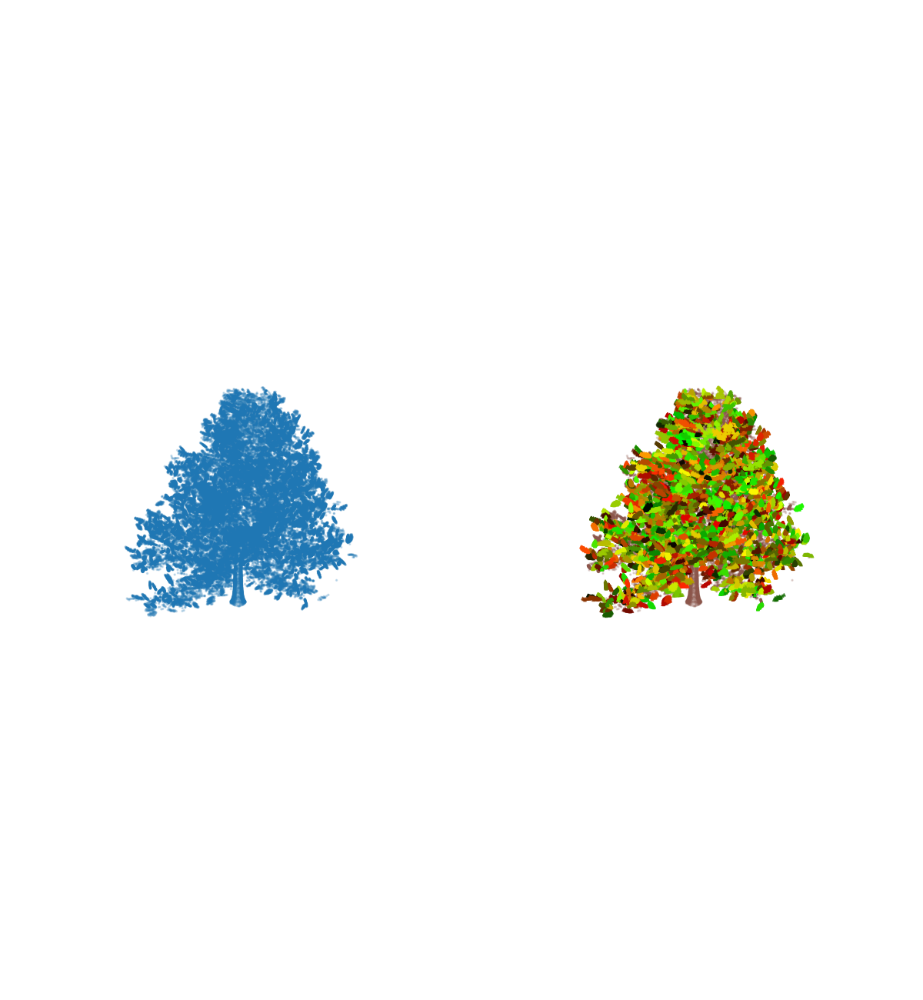

In [79]:
# plot tree using new labels
fig = plt.figure(figsize=(12,13))
# plot a original point cloud with no labels for reference
# plot number 1
ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.scatter(orig_points[:,0], orig_points[:,1], orig_points[:,2], s=2, alpha=0.2)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
# ax.set_box_aspect([4, 4, 7])  # different aspect ratio
ax.set_box_aspect([1, 1, 1])
# rotate the view for better visualization, rotate along z axis by 10 degrees, clockwise
ax.view_init(azim=-2, elev=20)
# turn of grid and axes
ax.grid(False)
ax.set_axis_off()



# plot number 2
ax = fig.add_subplot(1, 2, 2, projection='3d')  
# remove points which belong to no cluster (label = -1)
# valid_indices = new_labels != -1
# sampled_points_plot = orig_points[valid_indices]
# labels_plot = new_labels[valid_indices] 
# leaf_indices = is_leaf_label[valid_indices]
sampled_points_plot = orig_points
labels_plot = new_labels
leaf_indices = is_leaf_label

colors_plot = np.array([label_to_color[label] for label in labels_plot])
# plot leaf points as triangles

non_leaf_indices = ~leaf_indices
ax.scatter(sampled_points_plot[non_leaf_indices,0], sampled_points_plot[non_leaf_indices,1], sampled_points_plot[non_leaf_indices,2], c='tab:brown', s=2, alpha=0.2)
# color map is red to green RdYlGn
ax.scatter(sampled_points_plot[leaf_indices,0], sampled_points_plot[leaf_indices,1], sampled_points_plot[leaf_indices,2], c=colors_plot[leaf_indices], s=6, marker='^', alpha=0.7)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
# ax.set_box_aspect([4, 4, 7])  # different aspect ratio
ax.set_box_aspect([1, 1, 1])
# rotate the view for better visualization, rotate along z axis by 10 degrees, clockwise
ax.view_init(azim=-2, elev=20)
# turn of grid and axes
ax.grid(False)
ax.set_axis_off()   
# plt.tight_layout()
plt.tight_layout()
plt.show()